# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


# Описание данных

Файл `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — `5.0`);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
    
    «Средний счёт: 1000–1500 ₽»;
    
    «Цена чашки капучино: 130–220 ₽»;
    
    «Цена бокала пива: 400–600 ₽».
    
    и так далее;
    
    
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»: 
    
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    
    
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»: 
    
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    
    
- `chain` — число, выраженное `0` или `1`, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    
    0 — заведение не является сетевым
    
    1 — заведение является сетевым
    
    
- `district` — административный район, в котором находится заведение, например Центральный административный округ;


- `seats` — количество посадочных мест.


## Загрузите данные и изучите общую информацию

Загрузите данные о заведениях общественного питания Москвы.

Путь к файлу: `/datasets/moscow_places.csv`.

Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [1]:
# загрузим все необходимые библиотеки

import pandas as pd 
import numpy as np
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go 
import plotly.io as pio
import matplotlib.pyplot as plt
import warnings
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
warnings.filterwarnings("ignore")

In [2]:
# чтение файлов с данными и сохранение в data

try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')


In [3]:
# обзор данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
769,Шашлык.рф,кафе,"Москва, Верхнелихоборская улица, 6",Северный административный округ,"ежедневно, 08:00–23:00",55.852134,37.559387,4.0,NaN,NaN,NaN,NaN,0,NaN
7147,Кафе Милениум,кафе,"Москва, Каширское шоссе, 55А",Южный административный округ,"ежедневно, 10:00–22:00",55.638511,37.692528,4.3,NaN,NaN,NaN,NaN,0,NaN
6026,Cassette Cafe,кофейня,"Москва, Духовской переулок, 17с11",Южный административный округ,"пн-пт 08:30–20:30; сб,вс 09:30–19:30",55.704599,37.615018,4.4,NaN,NaN,NaN,NaN,1,NaN
4987,Мясной ресторан The бык,ресторан,"Москва, Душинская улица, 14",Юго-Восточный административный округ,"ежедневно, 12:00–23:00",55.746142,37.704630,4.7,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,20.0
6910,Harvest Cocktail Bar,пиццерия,"Москва, улица Бутлерова, 17Б",Юго-Западный административный округ,"ежедневно, 10:00–03:00",55.647873,37.541062,4.7,выше среднего,Цена бокала пива:от 200 ₽,NaN,NaN,0,NaN
6084,Академическое,кофейня,"Москва, проспект 60-летия Октября, 9, стр. 2",Юго-Западный административный округ,пн-чт 08:30–17:30; пт 08:30–17:00,55.698650,37.580109,4.9,NaN,NaN,NaN,NaN,0,NaN
2712,One Price Coffee,кофейня,"Москва, Уральская улица, 1",Восточный административный округ,пн-пт 07:00–22:00; сб 08:00–21:00; вс 09:00–21:00,55.811754,37.798011,4.2,средние,NaN,NaN,NaN,1,48.0
5726,Tianya,ресторан,"Москва, Ломоносовский проспект, 29, корп. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.703748,37.516476,4.5,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,220.0
8368,Вкусно как дома,кафе,"Москва, Вешняковская улица, 18Б, стр. 5",Восточный административный округ,"ежедневно, 11:00–23:00",55.723306,37.823431,4.0,средние,Средний счёт:1000 ₽,1000.0,NaN,0,NaN
7847,Баам-кафе,кафе,"Москва, Булатниковский проезд, 14, корп. 1",Южный административный округ,NaN,55.583809,37.654986,3.5,NaN,NaN,NaN,NaN,0,0.0


In [5]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [6]:
# Пропуски в данных в %

for col in data.columns:
        pct_missing = np.mean(data[col].isnull())
        print('{} - {}%'.format(col, round(pct_missing*100)))


name - 0%
category - 0%
address - 0%
district - 0%
hours - 6%
lat - 0%
lng - 0%
rating - 0%
price - 61%
avg_bill - 55%
middle_avg_bill - 63%
middle_coffee_cup - 94%
chain - 0%
seats - 43%


In [7]:
display('Размерность датафрейма', data.shape)

'Размерность датафрейма'

(8406, 14)

In [8]:
print('Дубликатов строк в датасете: {}'.format(data.duplicated().sum()))

Дубликатов строк в датасете: 0


In [9]:
# замена значений в столбце chain на логические
def to_logical_values(x):
    if x==1:
        return True
    elif x==0:
        return False
data['chain'] = data['chain'].apply(to_logical_values)
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0


Именование столбцов произведено в подходящем для работы виде, можно оставить как есть. В нашем датафрейме 8406 строк и 14 столбцов. Все столбцы хранят данные в формате object или float

## Выполните предобработку данных

Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
Выполните предобработку данных:
Создайте столбец `street` с названиями улиц из столбца с адресом.

In [10]:
# Выведем столбцы, в которых есть пропуски в данных

columns = data.columns

for col in columns:
    nan_percentage = (data[col].isnull().sum()/len(data))*100  
    if nan_percentage > 0:
        print(f'{col}: {nan_percentage:.2f}%')

hours: 6.38%
price: 60.56%
avg_bill: 54.60%
middle_avg_bill: 62.54%
middle_coffee_cup: 93.64%
seats: 42.96%


Выведем столбцы с пропусками в данных и посмотрим возможно ли заполнить эти пропуски какими-либо значениями.

In [11]:
data[['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']]

,hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
0,"ежедневно, 10:00–22:00",NaN,NaN,NaN,NaN,NaN
1,"ежедневно, 10:00–22:00",выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,4.0
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",средние,Средний счёт:от 1000 ₽,1000.0,NaN,45.0
3,"ежедневно, 09:00–22:00",NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,NaN
4,"ежедневно, 10:00–22:00",средние,Средний счёт:400–600 ₽,500.0,NaN,148.0
...,...,...,...,...,...,...
8401,"ежедневно, 09:00–02:00",NaN,NaN,NaN,NaN,86.0
8402,"ежедневно, 08:00–22:00",NaN,NaN,NaN,NaN,150.0
8403,"ежедневно, круглосуточно",NaN,Средний счёт:от 150 ₽,150.0,NaN,150.0
8404,"ежедневно, круглосуточно",NaN,NaN,NaN,NaN,150.0


Часы работы заведений предсказать трудно, но и пропусков в этом столбце не так много. Оставлю как есть.
Цены в дальнейшем можно предугадать: в зависимости от того, в каком административном районе расположено заведение будем заполнять категорию цены на основе уже имеющихся данных в этом районе. Также поступим и со средним чеком (middle_avg_bill) и (middle_coffee_cup). Количество мест в заведении предсказать тоже трудно

### Создадим столбец street с названием из столбца с адресом.

In [12]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1].strip())
data['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

### Создайте столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае.

In [13]:
data['is_24/7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
data[['hours', 'is_24/7']]


,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


In [14]:
data.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats', 'street', 'is_24/7'],
      dtype='object')

In [15]:
data[data.duplicated(subset=['name', 'category', 'address', 'district'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7


## Анализ данных

Чтобы упростить работу и не писать каждый раз код, напишем функцию и будем передавать ей интересующие нас аргументы

In [16]:
# передаем функции аргументы: данные, столбец, заголовок и подписи осей
def display_countplot(df, column, title, ylabel, xlabel):     
    # размер графика
    plt.figure(figsize=(18, 8))
    # переменная, которая будет окрашивать наши столбцы в разные цвета
    palette = sns.color_palette('Reds', data[column].nunique()) 
    # разворачиваем цвета в палитре.
    # Иначе в некоторых случаях цвета графика и цвета на карте вводят в заблуждение
    palette.reverse() 
    # строим фигуру расположив столбцы в порядке убывания
    ax = sns.countplot(x=column, data=df, order = data[column].value_counts().index, palette=palette)
    # разворачиваем название столбцов и задаем шрифт
    plt.xticks(rotation=40, fontsize=16)
    # задаем шрифт по оси y
    plt.yticks(fontsize=16)
    # подписи ко всем осям и самому графику
    ax.set_title(title, fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=18)

    # цикл для отображения значений на каждом столбце
    for i in ax.patches:
        _x = i.get_x() + i.get_width() / 2
        _y = i.get_y() + i.get_height() + (i.get_height()*0.02)
        value = '{:.1f}'.format(i.get_height())
        ax.text(_x, _y, value, ha="center")
        

### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.


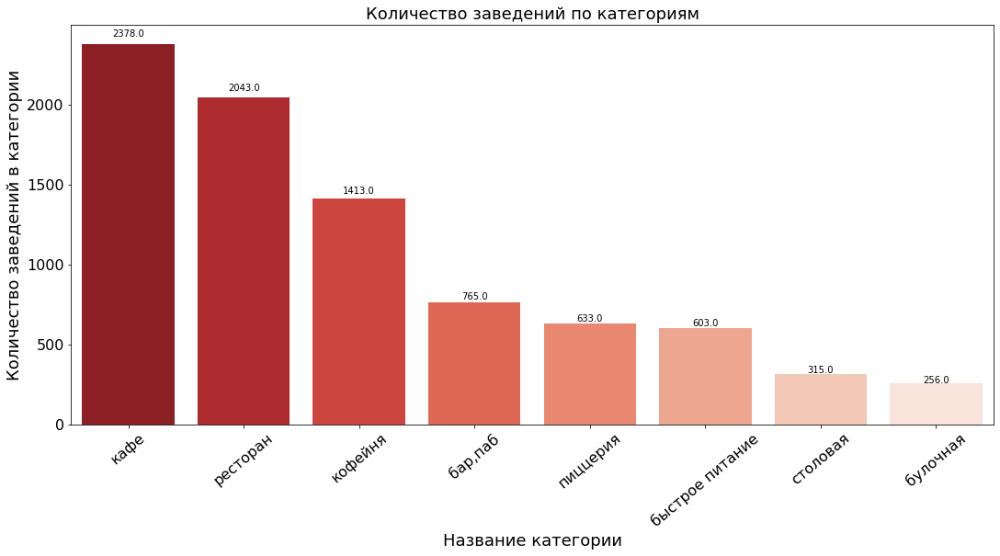

In [17]:
display_countplot(data, 'category',\
                 'Количество заведений по категориям',\
                 'Количество заведений в категории',\
                 'Название категории')

Наиболее популярны категории кафе – 2378, ресторан – 2043 и кофейня – 1413. Остальные категории уже имеют количество менее 1000 и идут с заметным отрывом.

### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы

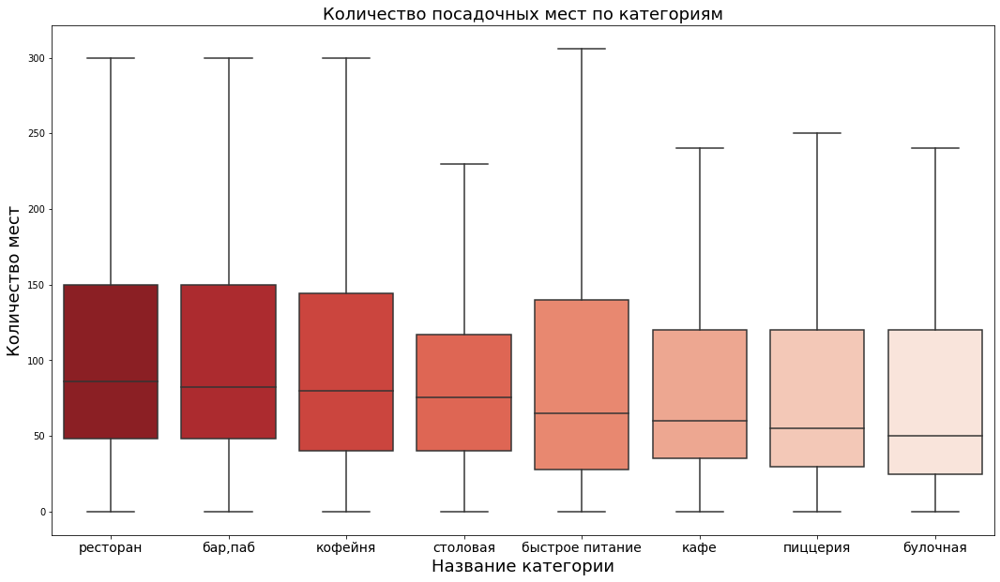

In [18]:
plt.figure(figsize=(18, 10))
palette = sns.color_palette('Reds', data['category'].nunique())
palette.reverse()

box_order = (data
             .groupby('category')['seats']
             .median()
             .sort_values(ascending=False)
             .index # сортировка по медиане
            )
ax = sns.boxplot(x='category', y='seats', data=data, order=box_order, palette=palette, showfliers=False) 

ax.set_ylabel('Количество мест', fontsize=18)
ax.set_xlabel('Название категории', fontsize=18)
plt.xticks(fontsize=14)
ax.set_title('Количество посадочных мест по категориям', fontsize=18);

In [19]:
data.groupby('category')['seats'].median().sort_values(ascending=False)

category
ресторан           86.0
бар,паб            82.5
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

Построив ящики с усами по количеству мест для каждой категории и упорядочив категории по медианным значениям видим, что в ресторанах, барах и кофейнях медианные значения количества посадочных мест равны 80 и более. Наименьшее медианное значение по посадочным местам наблюдается в кафе, пиццериях и булочных: количество мест в данных категориях заведений находится в пределах от 50 до 60 мест.
Выбросы наблюдаются по всем категориям.

In [20]:
chain_ratio = data.groupby('chain', as_index=False)['chain'].count()
chain_ratio = chain_ratio.reset_index()
chain_ratio.columns = ['Тип заведения', 'Количество']
chain_ratio['Тип заведения'] = chain_ratio['Тип заведения'].apply(lambda x: 'несетевое' if x == 0 else 'сетевое')
chain_ratio


,Тип заведения,Количество
0,несетевое,5201
1,сетевое,3205


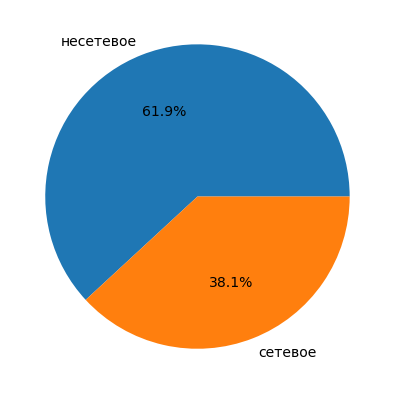

In [21]:
plt.figure(figsize=(7, 7))
y = chain_ratio['Количество']
mylabels = chain_ratio['Тип заведения']

plt.pie(y, labels = mylabels,  autopct='%1.1f%%',  textprops={'fontsize': 14})
plt.show() 


Несетевых заведений в наших данных больше, а именно 61,9%.

### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [22]:
df = data[['category','chain']]
df['chain'] = df['chain'].apply(lambda x: 'несетевое' if x == 0 else 'сетевое')
df_g = df.groupby(['category', 'chain']).size().reset_index()
df_g['percentage'] = (df
                      .groupby(['category', 'chain'])
                      .size()
                      .groupby(level=0)
                      .apply(lambda x: 100 * x / float(x.sum()))
                      .values
                     )
df_g.columns = ['category', 'chain', 'Counts', 'Percentage']
fig = (px
       .bar(df_g, x='category', y=['Counts'], color='chain', text=df_g['Percentage']
            .apply(lambda x: '{0:1.2f}%'
                   .format(x)),color_discrete_sequence=px.colors.sequential
            .RdBu,labels={
                     "value": "Количество заведений",
                     "category": "Название категории",
                     "chain": "сетевое / несетевое"
                 },
                title="Отношение сетевых к несетевым заведениям по категориям")
      )
fig.update_traces(textfont_size=20, textangle=0)
fig.show()

Кафе, рестораны, бары и столовые чаще других категорий являются несетевыми заведениями – половина и более заведений этой категории не принадлежит к сетям

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [23]:
def display_barplot(df, column_1, column_2, title, ylabel, xlabel, ylim_bott, ylim_top):
    plt.figure(figsize=(18, 8))
    palette = sns.color_palette('Reds', df[column_1].nunique())
    palette.reverse()
    ax = sns.barplot(x=df[column_1], y=df[column_2], palette=palette)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.set_title(title, fontsize=18);
    plt.xticks(rotation=70, fontsize=14)
    plt.yticks(fontsize=14)
    ax.set_ylim(ylim_bott, ylim_top)
    
    for i in ax.patches:
        _x = i.get_x() + i.get_width() / 2
        _y = i.get_y() + i.get_height() + (i.get_height()*0.01)
        value = '{:.2f}'.format(i.get_height())
        ax.text(_x, _y, value, ha="center")

Прежде чем группировать заведения по названиям, проверим есть ли в названиях дубликаты

In [24]:
print(f'До приведения названий к нижнему регистру было {data.name.nunique()} названий') 

До приведения названий к нижнему регистру было 5614 названий


In [25]:
data['name'] = data['name'].str.lower().str.replace('.', ' ')
print(f'После приведения названий к нижнему регистру стало {data.name.nunique()} названий') 

После приведения названий к нижнему регистру стало 5511 названий


Подготовим данные для визуализации. Сделаем 2 датафрейма: в первом посчитаем топ 15 сетей и выведем количество заведений в каждой сети изначально упорядочив по убыванию количества заведений в каждой сети (чтобы отобрать самые популярные). В этом датафрейме будут данные о категории, названии сети и количестве заведений в каждой сети. Далее упорядочим по названию категории. Это будет нужно в дальнейшем при визуализации и построении pie chart'а в plotly

In [26]:
top_15 = (data
          .query('chain == 1')
          .groupby(['name', 'category'])['name']
          .count()
          .sort_values(ascending=False)
          .to_frame()
          .head(15)
         )
top_15.columns = ['count']
top_15 = (top_15
          .reset_index(level=0)
          .reset_index(level=0)
          .sort_values(by='count', ascending=False)
         )
top_15

,category,name,count
0,кофейня,шоколадница,119
1,пиццерия,домино'с пицца,76
2,пиццерия,додо пицца,74
3,ресторан,яндекс лавка,72
4,кофейня,one price coffee,71
5,кофейня,cofix,65
6,ресторан,prime,49
7,кофейня,кофепорт,42
8,кафе,кулинарная лавка братьев караваевых,39
9,ресторан,теремок,36


Теперь на основе этого датафрейма сделаем еще один, в котором сгруппируем данные по категории заведения и просуммируем количество заведений в каждой категории. Эти данные пойдут во внутреннее кольцо данных в plotly

In [27]:
top_15_category = top_15.groupby('category')['count'].sum().to_frame().reset_index(level=0)
top_15_category

,category,count
0,булочная,25
1,кафе,89
2,кофейня,350
3,пиццерия,150
4,ресторан,157


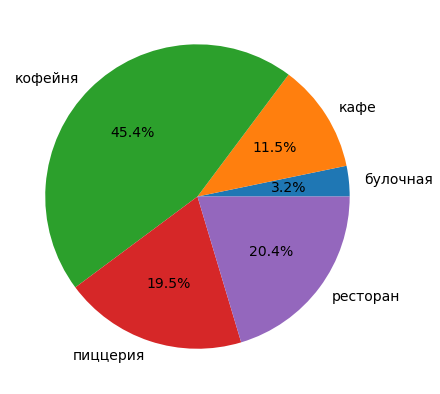

In [28]:
plt.figure(figsize=(7, 7))
y = top_15_category['count']
mylabels = top_15_category['category']

plt.pie(y, labels = mylabels,  autopct='%1.1f%%',  textprops={'fontsize': 14})
plt.show() 

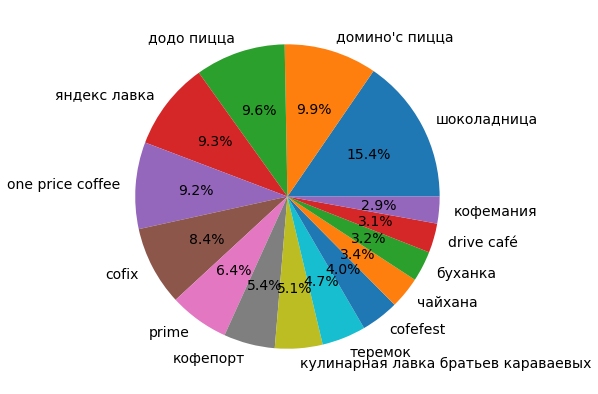

In [29]:
plt.figure(figsize=(7, 7))
y = top_15['count']
mylabels = top_15['name']

plt.pie(y, labels = mylabels,  autopct='%1.1f%%',  textprops={'fontsize': 14})
plt.show()

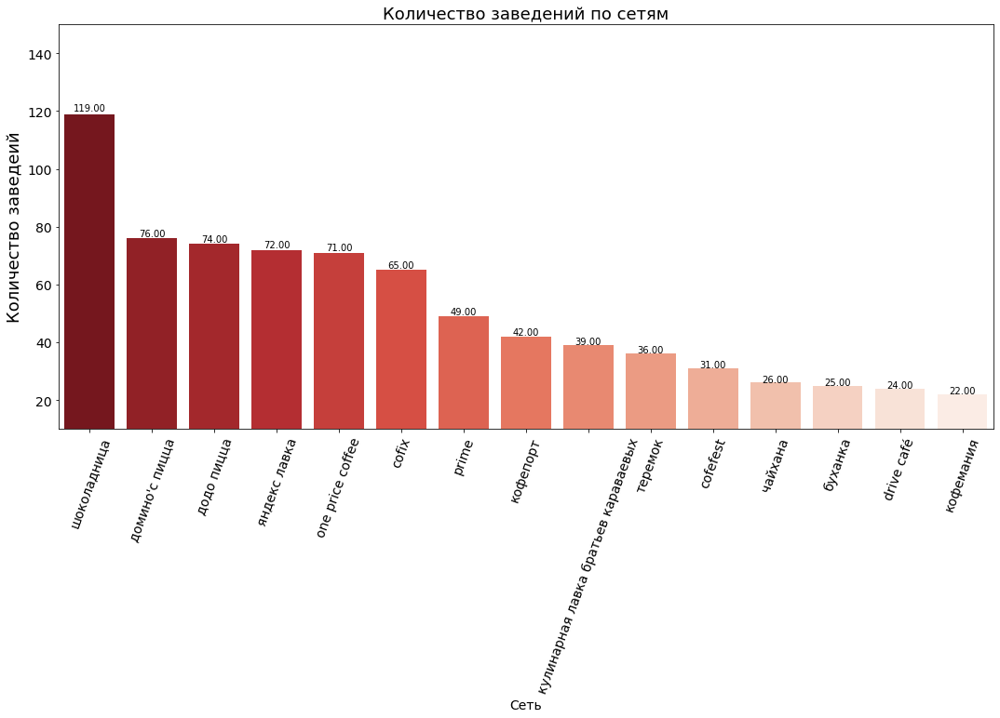

In [30]:
display_barplot(top_15, 'name', 'count',\
               'Количество заведений по сетям',\
               'Количество заведеий',\
               'Сеть',\
               10, 150)


Большая часть заведений относится к кофейням: среди топ-15 популярных сетей 45% (350) заведений принадлежат к категории кофейня. Наименее популярная категория 3% (25) – булочная. В целом относительное распределение заведений по категориям имеет следующий вид:
- кофейня – 45% (350)
- ресторан – 20% (157)
- пиццерия – 19,5% (150)
- кафе – 11,5% (89)
- булочная – 3.2% (25)

### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком

In [31]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Отображение таких длинных названий на осях будет сильноувеличивать график. Нужно сократить эти названия

In [32]:
district_abbreviations = {
    'Северный административный округ': 'САО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Западный административный округ': 'ЮЗАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Центральный административный округ': 'ЦАО',
    'Северо-Восточный административный округ': 'СВАО',
    'Зеленоградский административный округ': 'ЗАО'
}

data['district_cont'] = data['district'].replace(district_abbreviations)

### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [33]:
regions_category = (
    data
    .groupby(['district', 'category'], as_index=False)['name']
    .count()
    .sort_values(by= ['district', 'name'], ascending=False)
)
regions_category


,district,category,name
67,Южный административный округ,кафе,264
70,Южный административный округ,ресторан,202
68,Южный административный округ,кофейня,131
66,Южный административный округ,быстрое питание,85
69,Южный административный округ,пиццерия,73
...,...,...,...
5,Восточный административный округ,пиццерия,72
2,Восточный административный округ,быстрое питание,71
0,Восточный административный округ,"бар,паб",53
7,Восточный административный округ,столовая,40


In [34]:
df = data[['district_cont','category']]
df_g = df.groupby(['district_cont', 'category']).size().reset_index()
df_g['percentage'] = (df
                      .groupby(['district_cont','category'])
                      .size()
                      .groupby(level=0)
                      .apply(lambda x: 100 * x / float(x.sum()))
                      .values)
df_g.columns = ['district_cont', 'category', 'counts', 'percentage']
fig = (px
       .bar(df_g, x='district_cont', y=['counts'], color='category', text=df_g['percentage']
            .apply(lambda x: '{0:1.2f}%'
                   .format(x)),color_discrete_sequence=px.colors.sequential.RdBu,\
                       labels={
                     "value": "Количество заведений",
                     "district_cont": "Название административного района",
                     "category": "Категория"
                 },
                title="Отношение категорий в разных административных округах",
      height= 1000, 
            ))
fig.update_traces(textfont_size=20, textangle=0)

fig

На фоне всех остальных административных округов заметно выделяется центральный административный: в нем не только больше заведений в сравнении с остальными округами, но и соотношение по категориям заведений тоже имеет различие в определенных категориях. В центральном административном округе значительно больше баров (в 2-3 раза) и ресторанов (примерно на 10% в сравнении с остальными округами). Но при этом популярность кафе в центральном административном округе заметно ниже, чем в остальных округах. Больше всего кафе в юго-восточном административном округе

In [35]:
avg_rating = data.groupby('category', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)
avg_rating.columns = ['category', 'avg_rating']
avg_rating

,category,avg_rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`

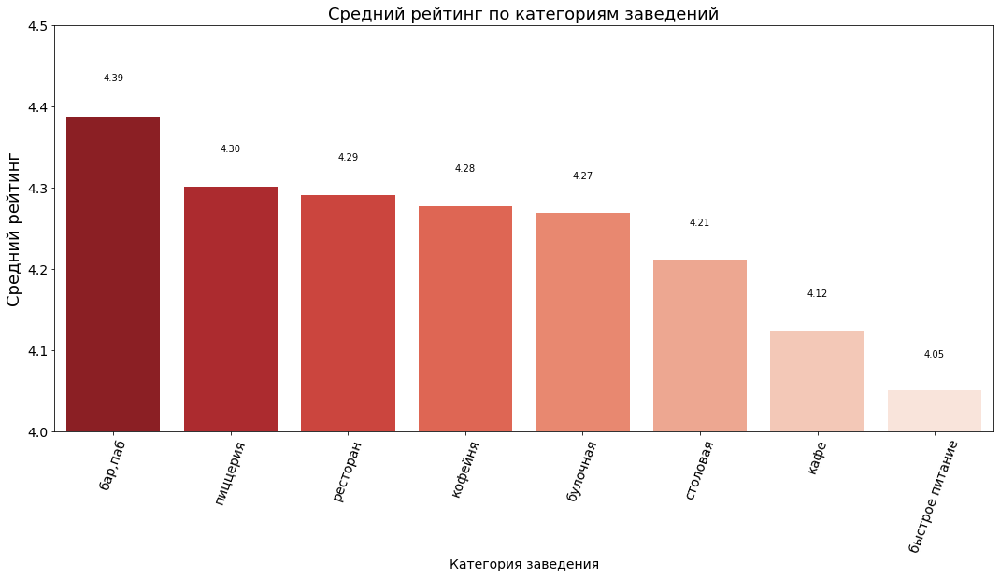

In [36]:
display_barplot(avg_rating, 'category', 'avg_rating',\
               'Средний рейтинг по категориям заведений',\
               'Средний рейтинг',\
               'Категория заведения',\
               4, 4.5)


In [37]:
rating_df = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
rating_df.sort_values(by='rating', ascending=False)


,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [38]:
def display_map(dataframe, value, title):
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
    
    loc = title
    title_html = '''
                 <h3 align="center" style="font-size:20px"><b>{}</b></h3>
                 '''.format(loc)
    
    
    moscow_lat, moscow_lng = 55.751244, 37.618423
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Stamen Toner')
    choropleth = folium.Choropleth(
                    geo_data=geo_json,
                    data=dataframe ,
                    columns=['district', value],
                    key_on='feature.name',
                    fill_color='Reds',
                    fill_opacity=0.8,
                    legend_name=title,
            ).add_to(m)

    # при наведении на округ показывает название округа
    choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields=['name'],
                                    aliases=['округ:'],
                                    labels=True,
                                    localize=True,
                                    sticky=False,
                                    )
    )
    m.get_root().html.add_child(folium.Element(title_html))
    m.save('image.html')
    return m

In [39]:
display_map(rating_df, 'rating', 'Средний рейтинг заведений по округам')

### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.


In [40]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

На графике я хочу отобразить процентное соотношение каттегорий заведений на каждой улице. Для того, чтобы создать столбец с процентами нужно подготовить новый датафрейм. Для начала сформируем датафрейм, где выведем название улицы и количество заведений на улице. Возьмем первые 15 улиц.

In [41]:
df = data.groupby(['street'], as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15)
df = df.sort_values(by='name', ascending=False)
df.columns = ['street', 'counts']
df


,street,counts
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Далее выведем название улицы, категории и количество заведений в этой категории.

In [42]:
df_cat = data.groupby(['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
df_cat = df_cat.sort_values(by='name', ascending=False)
df_cat.columns = ['street', 'category', 'counts']
df_cat.sort_values(by='counts', ascending=False, inplace=True)
df_cat

,street,category,counts
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1520,Монтажная улица,кофейня,1
1518,Молодёжная улица,кофейня,1
1517,Молодёжная улица,"бар,паб",1
1524,Московский проспект,пиццерия,1


Соеденим 2 датафрейма и получим только 15 улиц с наибольшим суммарным количеством заведений на улице с разбивкой по категориям

In [43]:
df = df_cat.merge(df, how='inner', on='street')
df

,street,category,counts_x,counts_y
0,проспект Мира,кафе,53,184
1,проспект Мира,ресторан,45,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
...,...,...,...,...
106,улица Вавилова,быстрое питание,11,55
107,улица Вавилова,кофейня,10,55
108,улица Вавилова,пиццерия,3,55
109,улица Вавилова,булочная,2,55


In [44]:
df['percentage'] = df['counts_x'] / df['counts_y'] * 100
df['percentage'] = df['percentage'].apply(lambda x: '{0:1.2f}%'.format(x))  
df.columns = ['street', 'category', 'count', 'count_street', 'percentage']
df

,street,category,count,count_street,percentage
0,проспект Мира,кафе,53,184,28.80%
1,проспект Мира,ресторан,45,184,24.46%
2,проспект Мира,кофейня,36,184,19.57%
3,проспект Мира,быстрое питание,21,184,11.41%
4,проспект Мира,"бар,паб",12,184,6.52%
...,...,...,...,...,...
106,улица Вавилова,быстрое питание,11,55,20.00%
107,улица Вавилова,кофейня,10,55,18.18%
108,улица Вавилова,пиццерия,3,55,5.45%
109,улица Вавилова,булочная,2,55,3.64%


In [45]:
fig = px.bar(df, x='street', y=['count'], color='category', text=df['percentage'],\
                       labels={
                     "value": "Количество заведений",
                     "street": "Название улицы",
                     "category": "Категория"
                 },
                title="Отношение категорий в разных административных округах",\
                color_discrete_sequence=px.colors.sequential.RdBu,\
                height= 1000)
fig.update_traces(textfont_size=20, textangle=0)
fig.show()

### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [46]:
one_estab_street = data.pivot_table(index='street', values='name', aggfunc='count').reset_index()
one_estab_street.query('name==1')

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [47]:
one_estab_street = data.pivot_table(index=['district_cont', 'street'], values='name', aggfunc='count').reset_index()
one_estab_street = one_estab_street.query('name==1')
one_estab_street = (one_estab_street
                    .groupby(['district_cont'], as_index=False)['name']
                    .sum()
                    .sort_values(by='name', ascending=False))
one_estab_street

,district_cont,name
5,ЦАО,148
3,СВАО,56
2,САО,53
0,ВАО,52
6,ЮАО,50
7,ЮВАО,42
1,ЗАО,36
4,СЗАО,21
8,ЮЗАО,18


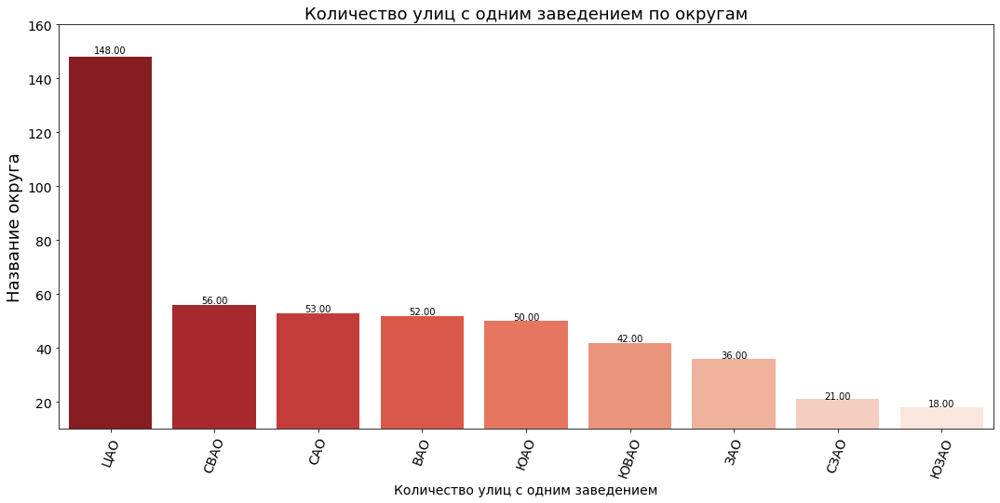

In [48]:
display_barplot(one_estab_street, 'district_cont', 'name',\
               'Количество улиц с одним заведением по округам',\
               'Название округа',\
               'Количество улиц с одним заведением',\
               10, 160)

Улиц, на которых расположен только один объект общепита – 458. Построим визуализацию, которая покажет нам в каком районе больше всего таких улиц.

Округ, на котором больше всего улиц с одним заведением – Центральный административный округ

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [49]:
bill_df = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()

In [50]:
display_map(bill_df, 'middle_avg_bill', 'Средний чек по округам')


Центральный и западный административные округа обладают самыми высокими ценами. Северный и северо-западные административные округа имеют среднюю цену за чек в промежутке 633-725. Восточный и юго-западный административные округа – 542-633.  Северо-восточный, юго-восточный и южный административные округа – 450-542.

### Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [51]:
aroundtheclock_df = data.groupby('district', as_index=False)['is_24/7'].mean()
display_map(aroundtheclock_df, 'is_24/7', 'Круглосуточные заведения в округах')


Как можем видеть больше всего круглосуточных заведений расположено в восточном административном округе и юго-восточном административном округе. Почему же так происходит? Построим гистограмму с распределением долей круглосуточных заведений в зависимости от катеогрии заведения.

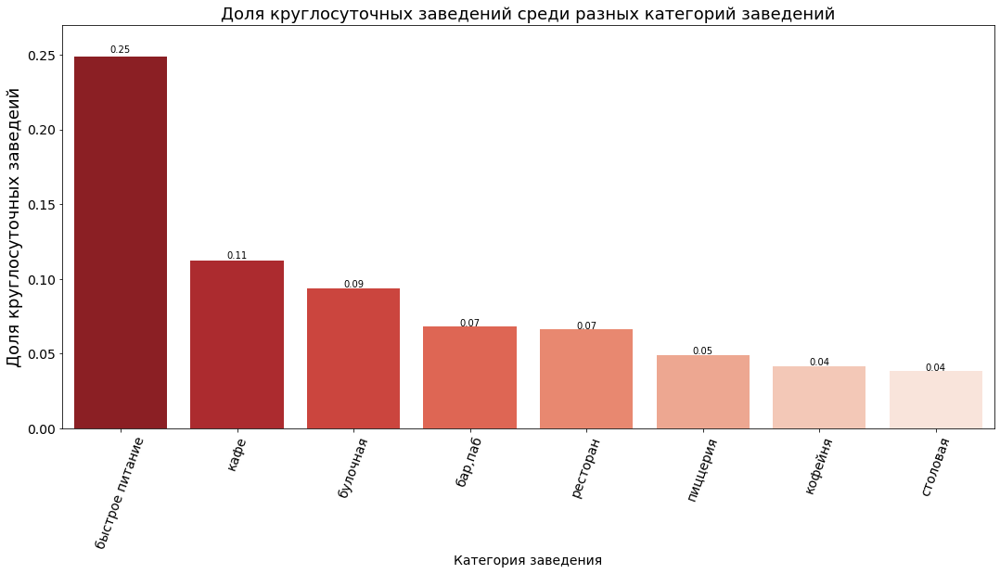

In [52]:
aroundtheclock_categ = (data
                        .groupby('category', as_index=False)['is_24/7']
                        .mean()
                        .sort_values(by='is_24/7', ascending=False)
                       )

display_barplot(aroundtheclock_categ, 'category', 'is_24/7',\
               'Доля круглосуточных заведений среди разных категорий заведений',\
               'Доля круглосуточных заведеий',\
               'Категория заведения',
               0, 0.27)


Рестораны быстрого питания значительно чаще работают круглосуточно 7 дней в неделю, чем все остальные категории заведений. На 2-ом месте – кафе. Обратившись к раннее построенному графику Отношение категорий в разных административных округах видим, что в восточном административном округе и юго-восточном административном округе расположено наибольшее количество кафе – 34% и 39,5% соответственно, что и делает эти округа самыми 'круглосуточными

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


По желанию вы можете расширить список вопросов для исследования, добавив собственные.

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.


### Сколько всего кофеен в датасете? 

In [53]:
coffee = data.query('category == "кофейня"')['name'].shape[0]
print(f'Всего кофеен в датасете: {coffee}')


Всего кофеен в датасете: 1413


### В каких районах их больше всего, каковы особенности их расположения?

In [54]:
coffee = (
    data
    .query('category == "кофейня"')
    .pivot_table(index='district', values='name', aggfunc='count')
    .reset_index()
    .sort_values(by='name', ascending=False)
)
coffee.columns = ['district', 'count']

In [55]:
display_map(coffee, 'count', 'Количество кофеен по округам')

В центральном административном округе обнаружено логово кофеинозависимых: несмотря на визуально меньшую площадь там наибольшее количество кофеен – 428. 2-ое место по количеству кофеен – северный административный округ, в котором 193 кофейни.

### Есть ли круглосуточные кофейни?

In [56]:
data.query('category == "кофейня"')['is_24/7'].mean()*100


4.175513092710545

In [57]:
data.query('category == "кофейня"')['hours'].value_counts().head(10)


ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
пн-пт 08:00–19:00                        46
ежедневно, 09:00–21:00                   43
пн-пт 08:00–22:00; сб,вс 09:00–22:00     42
ежедневно, 08:00–21:00                   36
пн-пт 08:00–18:30                        34
Name: hours, dtype: int64

Круглосуточные коофейни – достаточно редкое явление. Таких кофеен всего 4,2%, что в абсолютных показателях – 59 заведений. В основном кофейни работают с утра и до позднего вечера.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [58]:
coffee = (
    data
    .query('category == "кофейня"')
    .pivot_table(index='district', values='rating', aggfunc='mean')
    .reset_index()
    .sort_values(by='rating', ascending=False)
)
coffee.columns = ['district', 'avg_rating']

display_map(coffee, 'avg_rating', 'Рейтинги кофеен по регионам')


Рейтинги кофеен не сильно отличаются в зависимости от округа: максимальный рейтинг в центральном административном округе (4.33), а минимальный в западном (4.19).

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [59]:
avg_coffee = (data
              .query('category == "кофейня"')
              .pivot_table(index='district_cont', values='middle_coffee_cup', aggfunc=['mean','count'])
              .reset_index())
avg_coffee.columns = ['district', 'mean_bill', 'count']
avg_coffee = avg_coffee.sort_values(by='mean_bill', ascending=False)

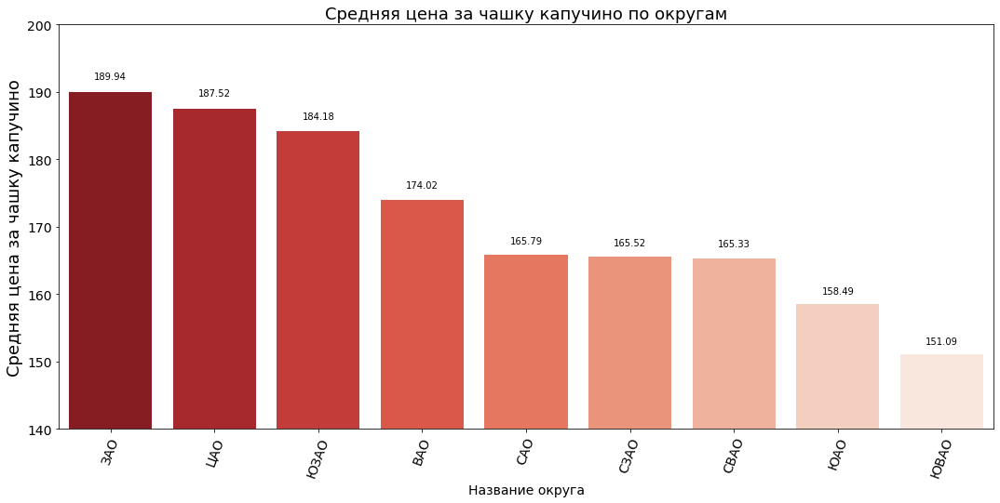

In [60]:
display_barplot(avg_coffee, 'district', 'mean_bill',\
               'Средняя цена за чашку капучино по округам',\
               'Средняя цена за чашку капучино',\
               'Название округа',
               140, 200)


В зависимости от округа открытия кофейни следует ориентироваться на цены: возможно при открытии стоит задать цены немного ниже средних по округу для привлечения первых клиентов.

Несмотря на то, что наш заказчик не боится конкуренции стоит учитывать, что, например, в центральном округе очень много кофеен и чтобы потенциальный клиент заметил именно нашу нужно будет очень постараться. Так же можно отметить все кофейни и посмотреть в каких метсах их еще нет. В это нам поможет карта ниже. На примере центрального административного округа я отобразил все кофейни.

In [61]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=12)
marker_cluster = MarkerCluster().add_to(m)

def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

data.query('category == "кофейня" and district == "Центральный административный округ"').apply(create_marker, axis=1)

m

В целом категория "кофейни" достаточно конкурента. Эта категория находится на 3 месте по количеств объектов среди всех категорий.

## Вывод

Для работы были получены данные о заведениях общественного питания в г. Москва.
Была проведена предобработка данных: созданы новые столбцы с названием улиц и информацией о часах работы заведения в бинарном формате – 0 если заведение не работает в формате 24/7 и 1, если заведение работает ежедневно и круглосуточно.

Была построена визуализация по категориям заведений. Данная визуализация показала, что наиболее популярные категории заведений:

- кафе – 2378 заведений
- ресторан – 2043 заведений
- кофейня – 1413 заведений
По количеству посадочных мест по медианным значениям топ возглавляют следующие 3 категории заведений:

- ресторан – 86 посадочных мест по медиане
- бар/паб – 82 посадочных места по медиане
- кофейня – 80 посадочных мест по медиане
По-видимому в данных категориях заведений люди любят проводить длительное время, чем и обосновывается количество посадочныъ мест.

Несетевых заведений в наших данных больше, а именно 5201 заведение, что составляет 62%  Кафе, рестораны, бары и столовые чаще других категорий являются сетевыми заведениями – половина и более заведений этой категории принадлежит к сетям.

Выделив наиболее популярные сети по количеству заведений можем наблюдать следующее распределение по категориям: кофейня – 45% (350)
- ресторан – 20% (157)
- пиццерия – 19,5% (150)
- кафе – 11,5% (89)
- булочная – 3.2% (25)
Эти показатели стоит учитывать при открытии заведений в том или ином районе Москвы, т.к. можно столкнуться с конкуренцией.

Центральный административный округ сильно отличается от всех остальных районов распределением по категориям заведений – в этом округе значительно больше баров и ресторанов. Но при этом популярность кафе снижена.

Также в ходе работы с данными была выяснена интересная особенность оценки различных заведений пользователями в зависимости от категории заведения: в среднем в барах и пабах люди оставляют более высокие оценки (~ 4.4), а в ресторанах общественного питания этот показатель наиболее низкий (~ 4). Еще на показатель средней оценки оказывает расположение заведения – самый высокий средний рейтинг в заведениях, расположеных в центральных административных округах – там больше баров / пабов, посетители которых оценивают эти заведения выше.

Центральный и западный административные округа обладают самыми высокими ценами. Северный и северо-западные административные округа имеют среднюю цену за чек в промежутке 633-725. Восточный и юго-западный административные округа – 542-633.  Северо-восточный, юго-восточный и южный административные округа – 450-542.

## Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков. 
Для создания презентации используйте любой удобный инструмент, но отправить презентацию нужно обязательно в формате PDF. Приложите ссылку на презентацию в markdown-ячейке в формате